# Vietnam retail footprint of leading brands 2020

This notebook is part of my project analyzing the stores footprint of leading retail brands in Vietnam. For more context on the problem statement, data source and analytical approach, you can check out my blog post on this project at [my Medium stories page](https://medium.com/@lbpham) or my [LinkedIn](https://www.linkedin.com/pulse/vietnam-retail-landscape-analysis-footprint-linh-bao-pham/?trackingId=WMGb4KH1wUkcF0HfDAY6gg%3D%3D)

Vietnam has been experiencing rapid retail growth of +10% between 2013-2020. As the country with the fastest-growing middle class in Southeast Asia, this phenomenal growth rate in its retail sector is expected to continue at least for the next five years. According to this report, although Vietnam's retail sector holds immense potential for growth, the level of competition is intense. With different store formats: commercial centers, supermarkets, grocery stores, and convenience stores, domestic and foreign retail giants in Vietnam are engaging in a battle for dominance as they embark on aggressive expansion strategies. At the same time, despite the rise of digital channels, physical channels continue to dominate the retail scene.

Therefore, interesting questions to ask are:
* How is the current retail footprint of these retail giants in Vietnam, and 
* Which province/city/district should be the next target for new stores. 

Who would be interested in answering these questions? The answer is the retail giants in Vietnam, as well as any new players who plan to enter the Vietnam retail market.

This notebook is the summarized version of my work on analyze and visualize findings from the store data. There will be three main sections in this notebook:
1. **Data cleaning**
2. **Exploratory Data Analysis**
3. **Model and Analysis**

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import json # open and read json file
import requests
import math # for calculation

# For formatting data
import unidecode # remove language accent from text

# For working with geo-data
import geopandas as gpd 
from geopandas.tools import geocode
from geopy.geocoders import Nominatim
from shapely.geometry import MultiPolygon

# For K-mean model
from sklearn import preprocessing # pre-process the data
from sklearn.cluster import KMeans

# For data visualization
from matplotlib import pyplot as plt
import seaborn as sns
import folium # for mapping
from folium import Choropleth, Marker
from folium.plugins import HeatMap, MarkerCluster

#import warnings # ignore warnings from Python
#warnings.filterwarnings("ignore")

print('Finish loading all libraries')

Finish loading all libraries


## 1. Data cleaning

Three main data sets used in this analysis:
* Geospatial Coordinates: geojson data of Vietnam at province and district level
* Census data: fundamental census data of Vietnam at province and district level including: population density, area, average income, human development index (HDI)
* Stores data: list of stores from major leading retailer brands in Vietnam, scrapped from their website

### 1.1. Geospatial Coordinates

These dataset are polygon datasets containing the geospatial data of provinces and district administration in Vietnam from [OpenDevelopmentMekong](https://data.opendevelopmentmekong.net/en/dataset/a-phn-huyn?type=dataset) database (retrieved on April 05th, 2020). These datasets (in JSON format) provide input for visualization of project results on the map of Vietnam.

Among all the data for this analysis, Administrative Division and Census data are in a structured format, requesting no further data cleaning and formating.


In [2]:
# Load geojson data in geo dataframe format
geodistricts = gpd.read_file("/kaggle/input/storesraw/vn_district.geojson").drop(columns=["f_code","Code_re"])
geodistricts.crs={'init':'epsg:4326'}
print("Complete loading Vietnam's District geojson")

geoprovince=gpd.read_file('/kaggle/input/storesraw/vn_province.geojson').rename(columns={'Name':'province'})
geoprovince.crs={'init':'epsg:4326'}
print("Complete loading Vietnam's Provincial geojson")

Complete loading Vietnam's District geojson
Complete loading Vietnam's Provincial geojson


### 1.2. Census data

This dataset includes Vietnam province's information on population, area, population density, Human Development Index, GDP/capital (retrieved on April 04th, 2020, from Wikipedia). This data was provided by the GSO census report on April 01st, 2019. However, since this data was not available via the GSO database, this dataset is obtained from [Wikipedia](https://vi.wikipedia.org/wiki/T%E1%BB%89nh_th%C3%A0nh_Vi%E1%BB%87t_Nam).

In [3]:
# Load census data
provinces = pd.read_csv("/kaggle/input/storesraw/province_census.csv").set_index('city',drop=True).rename_axis(None)
provinces.head()

,city_id,capital_center,area,population,density,urban,HDI,GDP/capital,region
Ha Noi,1,Hoan Kiem District,3119.0,7331909,2068.6,41.0,0.794,3923.21,Red River Delta
Ha Giang,2,Ha Giang,7945.8,724537,91.2,11.6,0.586,1083.72,Northeast
Cao Bang,4,Cao Bang,6724.6,507183,75.4,16.9,0.653,1564.27,Northeast
Bac Kan,6,Bac Kan,4868.4,293826,60.4,16.1,0.685,1766.68,Northeast
Tuyen Quang,8,Tuyen Quang,5870.4,724821,123.5,13.0,0.699,1948.18,Northeast


### 1.3. Stores data

Stores list of major retail chains: based on [Deloitte's report](https://www2.deloitte.com/vn/en/pages/consumer-business/articles/vietnam-consumer-retail-2019.html) on Vietnam Retail 2019, the following retail chains are identified, and their store list is obtained from their official websites by web scraping. The result of web scraping is the store list with (1) store name, (2) store address, and (3) latitude and longitude of the store.

Regarding the major retail chains, the following Supermarket, Convenience stores (CVS) and Grocery store chains, which are reported by Deloitte report on Vietnam retail landscape, are included in this analysis:

* Vingroup: VinMart - supermarket chain, and VinMart+ - CVS with different formats, from hybrid (i.e., CVS with fresh produce) to traditional CVS.
* Saigon Co.Op: Co.Op Mart supermarkets, Co.Op Smile - CVS, and Co.Op Food - fresh produce stores
* Satra: SatraMart - supermarkets
* Thegioididong: Bachhoaxanh - grocery stores
* 7-Eleven: CVS (only in Ho Chi Minh City)
* Aeon Group: MiniStop - CVS (only in Ho Chi Minh City and Binh Duong province)
* BigC: supermarket chain
* Circle K: CVS
* B'mart: CVS

In this section, the raw data (data scrapped from website of the retails) is reviewed and cleaned to prepare for the next step in process. The main tasks in data cleaning are:
* Remove duplicate data
* Format data (text, number and geo-coordinate)
* Matching the stores with the respective Group (network of brands) and type of stores (cvs or supermarket)
* Create summarized data by merging all dataset so far

In [6]:
# Import raw data from cvs
storesraw = pd.read_csv('/kaggle/input/storesraw/stores.csv', index_col=0)
print('Loading raw store data')

# Adding geocordinate data
stores = gpd.GeoDataFrame(storesraw, geometry=gpd.points_from_xy(storesraw.lng, storesraw.lat)).reset_index(drop=True)
stores.crs={'init':'epsg:4326'}
print('Complete adding geodata')

# Remove accent from text field (store_name and address)
stores['store_name'] = stores.store_name.astype('str').map(lambda x: unidecode.unidecode(x))
stores['address'] = stores.address.astype('str').map(lambda x: unidecode.unidecode(x))
print('Complete removing accent from text')

# Remove duplicate row
stores.drop_duplicates(keep='first', inplace=True)
print('Remove {} duplicate data rows'.format(len(storesraw)-len(stores)))

# Map data with store types and brands
## Create mapping dataframe to match
sm = ['satra','lotte','vissan','bigc','vinmart','aeon-city','aeon','hifoods']
vg = ['vinmart+','vinmart']
coop = ['coop-food','coopsmile']
bhx = ['bhx']
satra = ['satra']

## Mapping to the stores data
stores['format'] = stores.brand.map(lambda x: 'supermarket' if x in sm else 'cvs')
stores['group'] = stores.brand.map(lambda x: 'VinGroup' if x in vg else ('CoOp' if x in coop else('BHX' if x in bhx else('Satra' if x in satra else 'Other'))))
print('Complete mapping store with brands and store types')

## Merge with geodata
storesdf=gpd.sjoin(stores, geodistricts, how='left').drop(columns=['index_right'])

#print('{} rows with missing data'.format(storesdf.isnull().values.ravel().sum()))
print('{} rows with missing data'.format(len(storesdf.loc[storesdf.Province.isnull()])))
print('Stores data after cleaning')
storesdf.head()

Loading raw store data
Complete adding geodata
Complete removing accent from text
Remove 15 duplicate data rows
Complete mapping store with brands and store types
119 rows with missing data
Stores data after cleaning


,store_name,brand,address,lat,lng,geometry,format,group,OBJECTID,Province,District,Pop_2009
0,VM+ VTU Dat trong giao xu Thanh Phong,vinmart+,"Dat trong giao xu Thanh Phong, to 1, ap My Tha...",10.629770,107.040953,POINT (107.04095 10.62977),cvs,VinGroup,108.0,Ba Ria - Vung Tau,Tan Thanh,128205.0
1,VM+ VTU 15-17 Nguyen Huu Canh,vinmart+,"15-17 Nguyen Huu Canh, phuong Nguyen An Ninh, ...",10.395165,107.105498,POINT (107.10550 10.39517),cvs,VinGroup,1393.0,Ba Ria - Vung Tau,Vung Tau,296237.0
2,VM+ VTU 679 - 681 Vo Van Kiet,vinmart+,"679 - 681 Vo Van Kiet, P.Long Tam, Ba Ria - Vu...",10.506329,107.196007,POINT (107.19601 10.50633),cvs,VinGroup,94.0,Ba Ria - Vung Tau,Ba Ria,94725.0
3,VM+ VTU 83 Nguyen Cu Trinh,vinmart+,"83 Nguyen Cu Trinh, thi xa Phu My, Tinh Ba Ria...",10.588094,107.058677,POINT (107.05868 10.58809),cvs,VinGroup,108.0,Ba Ria - Vung Tau,Tan Thanh,128205.0
4,"VM+ VTU To 3, Ap My Xuan",vinmart+,"To 3, Ap My Xuan, huyen Tan Thanh, Ba Ria - Vu...",10.626901,107.051811,POINT (107.05181 10.62690),cvs,VinGroup,108.0,Ba Ria - Vung Tau,Tan Thanh,128205.0


With ~120 rows with missing data, cannot matched with its respective province, we manually match the store with province using the text address, resulting only 8 rows with missing data after matching. Since this number is very small considering the dataset size is +6000 rows, I ignored these 8 rows for further analysis.

In [7]:
# Adding province name manually to the data set
## Build function to find province name in the address
def findprovince(row,provinces):
    for province in provinces:
        if province.lower() in row['address'].lower():
            return pd.Series({'Province': province})
        if 'hcm' in row['address'].lower() or 'ho chi minh' in row['address'].lower():
            return pd.Series({'Province': 'TP. Ho Chi Minh'})
        if 'vung tau' in row['address'].lower():
            return pd.Series({'Province': 'Ba Ria - Vung Tau'})
    return None

## Apply function to rows with missing Province name
storesdf.loc[storesdf.Province.isnull(),['Province']]=storesdf.loc[storesdf.Province.isnull()].apply(lambda x: findprovince(x,list(geoprovince.province)), axis=1)
print('{} data rows with missing Province name'.format(len(storesdf.loc[storesdf.Province.isnull()])))

storesdf.loc[storesdf.Province.isnull()]

8 data rows with missing Province name


,store_name,brand,address,lat,lng,geometry,format,group,OBJECTID,Province,District,Pop_2009
2945,Satrafoods HOA SEN,satra,nan,NaN,NaN,POINT (nan nan),supermarket,Satra,NaN,None,NaN,NaN
2951,Satrafoods TO KY,satra,nan,NaN,NaN,POINT (nan nan),supermarket,Satra,NaN,None,NaN,NaN
2984,Satrafoods CAY TRAM,satra,nan,NaN,NaN,POINT (nan nan),supermarket,Satra,NaN,None,NaN,NaN
5137,FamilyMart - BINh DUoNg,familymart,"G05,TANg TrET,Block CT2, ThUA DaT 351, DaI LO ...",NaN,NaN,POINT (nan nan),cvs,Other,NaN,None,NaN,NaN
5529,SOI BiEN Long KhANh,soibien,"03-06 Long KhANh, ThI TrAN TrAM TrOI, HuyEN Ho...",NaN,NaN,POINT (nan nan),cvs,Other,NaN,None,NaN,NaN
5803,VinMart Binh Trung,vinmart,"231 Nguyen Thi Dinh, phuong Binh Trung Tay",NaN,NaN,POINT (nan nan),supermarket,VinGroup,NaN,None,NaN,NaN
5843,GS25 La Astoria,gs25,"T1.05-1, T1.05-2, T1.05-3 ThuOC TANg TrET, KhO...",NaN,NaN,POINT (nan nan),cvs,Other,NaN,None,NaN,NaN
5899,CF LIEN KHU 4 - 5,coop-food,"144/5 LiEN Khu 4 - 5, KP 4, P. BINh HUNg HOA B...",NaN,NaN,POINT (nan nan),cvs,CoOp,NaN,None,NaN,NaN


In the last step of create summarized data by merging all dataset, ~120 data rows cannot be matched due to missing data or cannot be matched by geo data. Since the number is small - only 2% total data set - after trying to match manually store with province using address, I decided to ignore 8 rows that cannot be matched.

After the merging step, we have the list of province with number of store in each province

In [8]:
# Count the number of stores (total, cvs and supermarket):
storecount = pd.DataFrame(storesdf.Province.value_counts()).rename(columns={'Province':'nstores'})
for stype in storesdf['format'].unique():
    tem=pd.DataFrame(storesdf.loc[storesdf.format==stype].Province.value_counts()).rename(columns={'Province':stype})
    storecount = pd.merge(left=storecount, right=tem,
                          left_index=True, right_index=True,how='left').fillna(0)

# Merge the store count with province census
listprovinces=pd.merge(left=provinces, right=storecount,
                       left_index=True, right_index=True)
print('{} of stores matched with provinces, out of {} stores in the original stores data'.
      format(listprovinces.nstores.sum(),len(stores)))
listprovinces.head()

6025 of stores matched with provinces, out of 6033 stores in the original stores data


,city_id,capital_center,area,population,density,urban,HDI,GDP/capital,region,nstores,cvs,supermarket
Ha Noi,1,Hoan Kiem District,3119.0,7331909,2068.6,41.0,0.794,3923.21,Red River Delta,1075,1038,37.0
Ha Giang,2,Ha Giang,7945.8,724537,91.2,11.6,0.586,1083.72,Northeast,9,9,0.0
Tuyen Quang,8,Tuyen Quang,5870.4,724821,123.5,13.0,0.699,1948.18,Northeast,10,10,0.0
Lao Cai,10,Lao Cai,6383.9,614595,96.3,21.0,0.670,2767.55,Northeast,12,12,0.0
Dien Bien,11,Dien Bien Phu,9562.5,490306,51.3,15.0,0.611,1589.03,Northwest,1,1,0.0


## 2. Exploratory Data Analysis

Explanatory data analysis (EDA) was conducted to gain further understanding of the dataset and to select data features for the clustering model. In this section, we will deep-dive into each data set: (1) Province data and (2) Store data to better understand the data before moving into modeling and deep-dive analysis

### 2.1. Province data

To have an overiew of the data, Data Attributes Pairwise Plots below provide a great picture of all data attributes:
* For stores count (all store, cvs or supermarket): the data distribution show a long tail with some spikes indicating outliner values. It's can be seen immediately that the number of stores in Hanoi and Ho Chi Minh City are significantly higher than that of other province, leading to the shape of data distribution in these data attributes.
* For GDP/Capital: the data distribution is almost identical with that of store count, indicating the allocation of stores is higher correlated with average income in each province, which is expected.
* For area and HDI, the data distribution is very close to a bell-shape (normal distribution)
* For the remaining data attributes, the distribution tends to have a long tail which representing the developed provinces such as Hanoi, Ho Chi Minh or Da Nang with high population, and density.

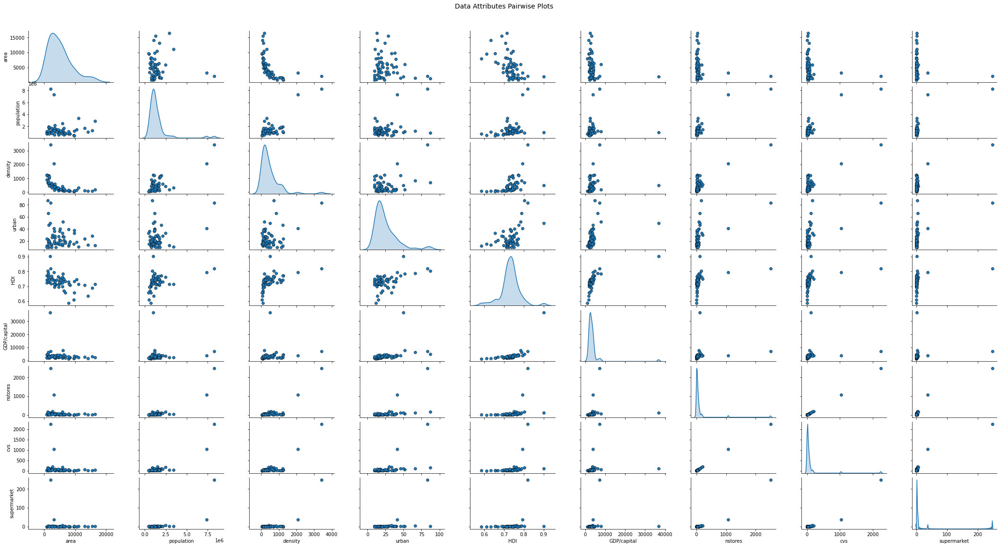

In [11]:
# Pair-wise Scatter Plots (all data points)
cols = [e for e in list(listprovinces.columns) if e not in ('city_id', 'capital_center','region')]
pp = sns.pairplot(listprovinces[cols], height=1.8, aspect=1.8,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", diag_kws=dict(shade=True))

fig = pp.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t=fig.suptitle('Data Attributes Pairwise Plots', fontsize=14)

With further data exploration, it's learned that:
* Hanoi and Ho Chi Minh are such outliner data point across different data attributes
* Ba Ria - Vung Tau has average GDP/person of 36,000/year which is an outliner in this attributes

To have a better visualization of the data set, ignore these outliners, I created Data Attributes Pairwise Plots again without these three data point. After removing the outliner data points, we can see all Data Attributes now have a normal distribution or close to normal distribution. In the next section, we will see how the clustering work on this data set (list of provinces without outliners)

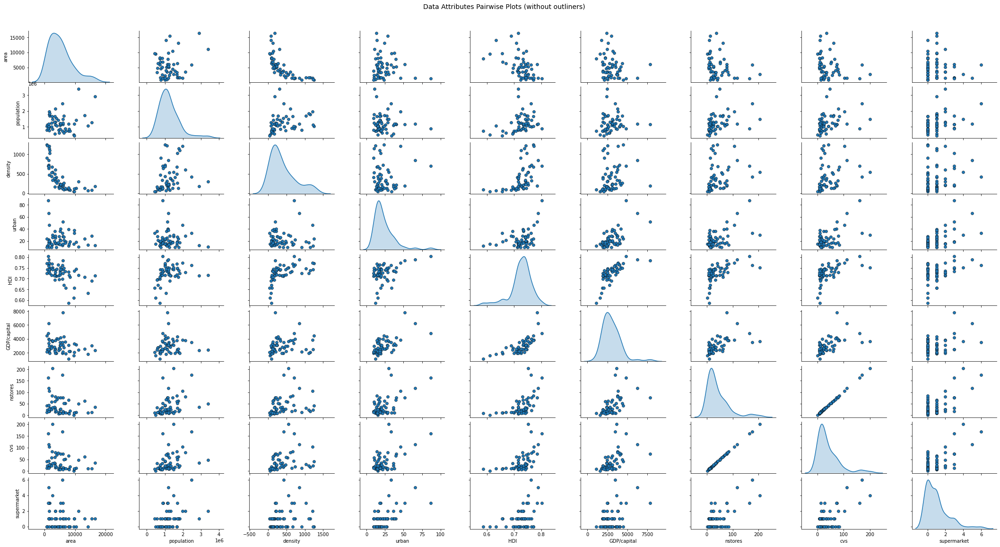

In [12]:
filterp = [e for e in list(listprovinces.index) if e not in ('Ha Noi', 'TP. Ho Chi Minh','Ba Ria - Vung Tau')]
pp = sns.pairplot(listprovinces[listprovinces.index.isin(filterp)][cols], height=1.8, aspect=1.8,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", diag_kws=dict(shade=True))

fig = pp.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Data Attributes Pairwise Plots (without outliners)', fontsize=14)

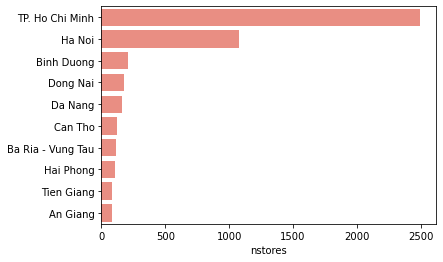

In [13]:
# Order the list of province by the number of stores
listprovinces.sort_values('nstores',ascending=False,inplace=True)
# Plot the bar chart for number of stores by provinces
sns.barplot(listprovinces.head(10).nstores,listprovinces.head(10).index, color="salmon")
#listprovinces.loc[:,['cvs','supermarket']].head(10).plot.bar(stacked=True, color=['salmon','blue'], figsize=(10,7))

### 2.2. Stores data

To have better visualization of store distribution across Vietnam, Folium library will be use to map the location of all stores in the data set. The following map indicate the store location, along with the store types:

In [19]:
# Define folium map for Vietnam
vietnam = [13.2904027, 108.4265113]
vnmap=folium.Map(location=[13.2904027, 108.4265113],zoom_start=6,title='Vietnam')

# Define color for each store type
colors={'cvs':'royalblue','supermarket':'crimson'}

# Adding Choropleth of average income/person
## Loading geojson data as json format
geodata=r'/kaggle/input/storesraw/vn_province.geojson'

## Adding choropleth to the map
folium.Choropleth(geo_data=geodata,
                 data=listprovinces.reset_index(drop=False),
                 columns=['index','GDP/capital'],
                 key_on='feature.properties.Name',
                 fill_color='YlOrRd',
                 fill_opacity=0.75, 
                 line_opacity=0.2,
                 legend_name='Average annual income/person',
                 threshold_scale=[0, 2000, 5000, 20000, 40000]).add_to(vnmap)

# Adding marker for each store and color by type
for stype in list(storesdf.format.unique()):
    # Filter the dataset with each store type
    marker=storesdf.loc[storesdf.format==stype].reset_index(drop=True)
    color=colors[stype]
    # Adding marker
    for i in range(marker.shape[0]):
        brand=marker.loc[i,'brand'].title()
        lat=marker.loc[i,'lat']
        lng=marker.loc[i,'lng']
        try:
            label = '{}: {},\nAddress: {}, {}'.format(stype.title(),
                                                      brand,
                                                      marker.loc[i,'District'].title(),
                                                      marker.loc[i,'Province'].title())
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker([lat, lng],radius=1,popup=label,color=color,
                                fill=True,fill_color=color,fill_opacity=0.5,
                                parse_html=False).add_to(vnmap)
        except:
            continue

folium.LayerControl().add_to(vnmap)
vnmap

## 3. Model and Analysis

### 3.1. Clustering of provinces

To answer the question: 'Which province/city/district should be the next target for new stores', the clustering technique will be used to identify the group of provinces with high potential based on the statistic data and the current competitiveness of retail market in those provinces.

For this project, the K-Means Clustering method will be used to profile provinces/districts based on the retail footprint and statistical census. From Toward Data Science, K-Means Clustering is an unsupervised machine learning algorithm, attempting to classify data without having first been trained with labeled data. Since the purpose of this project is to understand the retail footprint across different Administrative Division in Vietnam, this method is selected.

To identify the optimum number of clusters in this analysis, we will evaluate the relationship between the number of clusters and Within Cluster Sum of Squares (WCSS) to select the number of clusters where the change in WCSS begins to level off (elbow method).

The following variables were selected: population density, urbanization level, human development index (HDI), income per capita, and the number of stores in each category located in each province (supermarket, CVS, etc.). Using the elbow method, four is the best number of clusters for this analysis:


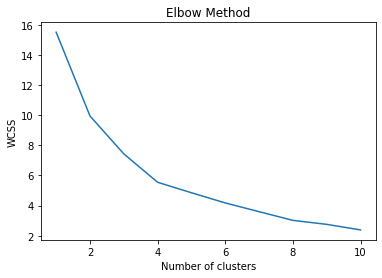

In [22]:
# Filter the columns and rows for the clustering
cols = [e for e in list(listprovinces.columns) if e not in ('city_id', 'capital_center',
                                                            'region','cvs','supermarket','population')]
filterp = [e for e in list(listprovinces.index) if e not in ('Ha Noi', 'TP. Ho Chi Minh','Ba Ria - Vung Tau')]
inputx=listprovinces[listprovinces.index.isin(filterp)][cols].copy(deep=True)

# Scale the data for clustering
scaler = preprocessing.MinMaxScaler()
for col in cols:
    inputx[col]=scaler.fit_transform(np.array(inputx[col]).reshape(-1, 1))

# Running clustering with different number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=1000, n_init=10, random_state=0)
    kmeans.fit(inputx)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

With three cluster as specification for our model, kmean clustering model classfied all province (except for the outliners) into three groups. To see how these three cluster different across data attribute, we once again plot the Attributes Pairwise Plot to see how data distribution differ between clusters

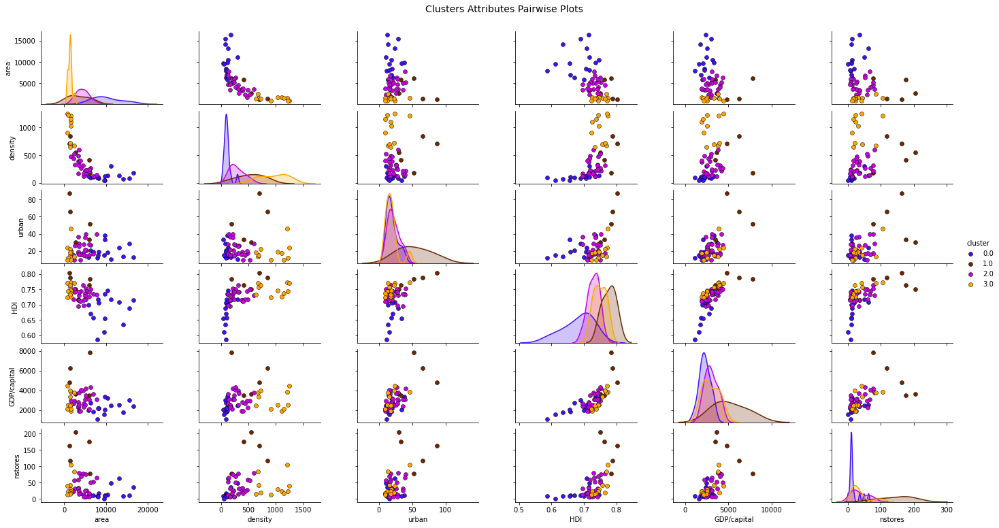

In [23]:
# Running kmean cluster with 3 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=1000, n_init=10, random_state=0)
inputx['cluster']=kmeans.fit_predict(inputx)

# Adding cluster result to the data
result = pd.merge(left=listprovinces,right=inputx['cluster'],left_index=True,right_index=True,how='left')
cols = [e for e in list(result.columns) if e not in ('city_id', 'capital_center',
                                                     'region','cvs','supermarket','population')]

# Define color for each cluster
colork={1:'#6B2700', 2:'#C504DE', 0:'#4112F0', 3:'orange'}

# Scatter Plot with Hue for visualizing data in 3-D
pp = sns.pairplot(result[cols], hue='cluster', height=1.8, aspect=1.8, 
                  palette=colork,
                  plot_kws=dict(edgecolor="black", linewidth=0.5))
fig = pp.fig
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Clusters Attributes Pairwise Plots', fontsize=14)

Further look into the statistical indication of each cluster, we can identify the main characteristic of each cluster as follow:
* Cluster 1 - Developing markets: provinces with high population density, urbanization and income. Retailers have eyes on this markets which reflect in the high number of store per province. However, considering the growth and potential, more stores should be considered to be placed in these market
* Cluster 3 - Hidden market: provinces with similar socioeconomic as those in cluster 2 but has not been explored by retailers. In facts, these provinces event have higher population density than those in cluster 1. However, the number of stores per province is significantly lower than that of cluster 1. Understanding that the gap in average income/person is the main explaination behind, retailers should still keep their eyes on these province as they will be the next target markets in the near future.
* Cluster 0 & 2: Developing provinces with very low population density. Even though the average income per person is in the same level as that of cluster 1, the low population density may be a challenge for brands to maintain its presence without sizable market around the stores location

In [24]:
stat = ['count','min','mean','max','std']
colstat = ['area','density','urban','GDP/capital','nstores']
for i in inputx.cluster.unique():
    print('\nCluster {}: {} and ... '.format(i,list(result.loc[result.cluster==i].head().index)))
    print(result.loc[result.cluster==i].describe().loc[stat,colstat])


Cluster 1: ['Binh Duong', 'Dong Nai', 'Da Nang', 'Can Tho', 'Quang Ninh'] and ... 
              area     density      urban  GDP/capital     nstores
count     5.000000    5.000000   5.000000     5.000000    5.000000
min    1257.300000  187.700000  29.900000  3485.160000   77.000000
mean   3471.600000  542.400000  53.560000  5211.070000  147.800000
max    6099.000000  847.900000  86.900000  7834.550000  205.000000
std    2377.424221  255.247919  23.669136  1838.287199   50.435107

Cluster 3: ['Hai Phong', 'Tien Giang', 'Vinh Long', 'Bac Ninh', 'Hai Duong'] and ... 
              area      density      urban  GDP/capital     nstores
count    11.000000    11.000000  11.000000    11.000000   11.000000
min     823.100000   645.600000   9.500000  1904.970000   13.000000
mean   1427.818182   965.172727  18.800000  3005.203636   37.909091
max    2484.200000  1244.700000  46.100000  4451.410000  106.000000
std     467.828949   241.438572  10.173888   899.044452   30.243857

Cluster 2: ['An Gi

### 3.2. Store Network Coverage Analysis

In the previous analysis, Ho Chi Minh, Hanoi and Vung Tau were not included as these are outliner value in the dataset. For Ho Chi Minh (HCM) and Hanoi (HN), these are the two biggest cities in Vietnam and therefore no surprise, have +1000 stores in each cities. The questions for retailers in these market is no longer about whether they should enter the market, but rather how to operate in these competitive market to achieve better profitability. Therefore, this section will be focus on the analysis of store network in each city, to analize and evaluate the coverage and effciencies of store network in each city.

With that idea in mind, I will focus on my findings for Ho Chi Minh store network due to the two following reasons: 
* (1) HCM is the bigger market (considering the population, population density and average income per person between the two cities); and 
* (2) Hanoi market was dominated by Vinmart stores and not many brands can compete against Vinmart (among retail stores in Hanoi, not including mom-and-pop shops, Vinmart stores makes up to 77%), while the opposite is true for HCMC.

From the analysis in this section, I want to answer three questions:
* Store footprint: Break down the store allocation to the district level and review store density relative to the population density at the district level
* Geographic coverage: Compare the geographical coverage of the store network from different brands to find the store network with the best coverage. Coverage is defined, for this analysis, as the collection of all points within a given distance of each store in the network. Meaning the area in which customers have access to retail stores within a given distance.
* Where to go next: Identify areas/locations within the city that should be considered by brands for stores opening to increase their coverage in the city.

Data used in this sections include:
* Store data: all stores from the original stores data, that is located in Ho Chi Minh
* Census data of HCM: including population, area and density by districts
* Geocoordinate of HCM districts.

In [50]:
# Data prep for the analysis
# Loading the stat data for Ho Chi Minh district
hcmstat = pd.read_csv('/kaggle/input/storesraw/district_hcm.csv')
hcmstat['District'] = hcmstat.District.astype('str').map(lambda x: unidecode.unidecode(x))

# Filter store data for stores in HCM only and remove store with missing data
hcmstores = storesdf.loc[storesdf.Province=='TP. Ho Chi Minh'].reset_index(drop=True)
hcmstores=hcmstores.loc[hcmstores.lat.notnull()].reset_index(drop=True)

# Loading the geodata for HCM district
hcmgeo=json.loads(geodistricts.loc[geodistricts.Province=='TP. Ho Chi Minh'].to_json())

# Define location of the city
hcml = [10.82302, 106.62965]

print('Complete preparing data')

Complete preparing data


#### 3.2.1. Store footprint
To explore this aspect, I looked at how stores are located relative to other stores in the same network and to the population density within the city.



In [26]:
# Set up the folium map if HCM
hcmmap=folium.Map(location=hcml,zoom_start=11,title='Ho Chi Minh')

## Define color for the markers
colors={'cvs':'royalblue','supermarket':'crimson'}

## Adding store markers to the map
for stype in list(hcmstores.format.unique()):
    # Filter the dataset with each store type
    marker=hcmstores.loc[hcmstores.format==stype].reset_index(drop=True)
    color=colors[stype]
    # Adding marker
    for i in range(marker.shape[0]):
        brand=marker.loc[i,'brand'].title()
        lat=marker.loc[i,'lat']
        lng=marker.loc[i,'lng']
        try:
            label = '{}: {},\nAddress: {}, {}'.format(stype.title(),
                                                      brand,
                                                      marker.loc[i,'District'].title(),
                                                      marker.loc[i,'Province'].title())
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker([lat, lng],radius=1,popup=label,color=color,
                                fill=True,fill_color=color,fill_opacity=0.5,
                                parse_html=False).add_to(hcmmap)
        except:
            continue

hcmmap

In [58]:
# Create map with store location and coverage
hcmmap2=folium.Map(location=hcml,zoom_start=11,title='Ho Chi Minh')

# Add markers clusters to the map
mc = MarkerCluster()
for idx, row in hcmstores.iterrows():
    if not math.isnan(row['lng']) and not math.isnan(row['lat']):
        mc.add_child(Marker([row['lat'], row['lng']]))
hcmmap2.add_child(mc)

# Display the map
folium.LayerControl().add_to(hcmmap2)
hcmmap2

#### 3.2.2. Geographic coverage

To compare the geographical coverage of the store network from different brands, I used the buffer function in geopandas to obtain the collection of all points within a given distance of each store in the same network.

For example, two maps above show the collection of all points within a 500-meter distance of each store from Vinmart and BHX — the two stores network with the highest number of stores in HCMC. No surprise that Vinmart stores are mostly located in the center of the city where higher population density is observed, covering substantially the center area. On the other hand, the BHX stores network leaves a considerable portion of the area in the city center with no stores despite the assumed high population density.

In [118]:
# Define buffer for VinGroup stores network in HCM within 500 meters
vmbuffer=hcmstores.loc[hcmstores.group=='VinGroup'].geometry.buffer(0.005).unary_union

# Create map of Ho Chi Minh
hcm_vm=folium.Map(location=hcml,zoom_start=11,title='Ho Chi Minh')

# Adding buffer to the map:
folium.GeoJson(vmbuffer).add_to(hcm_vm)

# Display the map
folium.LayerControl().add_to(hcm_vm)
hcm_vm

To further compare the coverage, I looked at the percentage of area in HCMC that is within a given distance (between 100 meters and 1 km) of each store from different brands, using the .intersect and .area function from geopandas.

As a result, this line chart presents the percentage of area in HCMC that is within a given distance between 100 meters and 1km for store network from VinMart, BHX, CircleK, CoOp (including Coopfood and Coopsmile), Satra and other retail brands in HCMC.

The higher the number of stores, the higher the coverage observed, as per expectation. However, the only exception is that BHX surpasses VinMart in terms of coverage with a distance of around 600 meters or higher, despite the fact that BHX has 20% fewer stores compared to VinMart. This can be explained by the fact that ~80% of VinMart stores located in the city center districts, while that number is only ~68% for BHX. As a result, with the increase in distance of buffer, VinMart store network’s coverage increases at a slower rate compared to that of BHX.

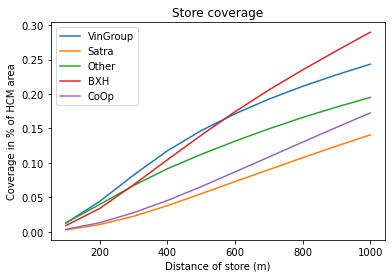

In [117]:
# Create buffer with distance of 500 meters
distances=[round(i*0.001,4) for i in range(1,11)]

# Calculate the area of HCM city
hcmarea=geoprovince.loc[geoprovince.province=='TP. Ho Chi Minh'].reset_index(drop=True).geometry[0].area

# Calculate the store coverage as % of HCM total area for each brand, across different distance
coverage={}
for group in hcmstores.group.unique():
    coverage[group]=[]
    for distance in distances:
        buffer=hcmstores.loc[hcmstores.group==group].geometry.buffer(distance).unary_union
        coverage[group].append(round(buffer.area/hcmarea,4))
        
coverage=pd.DataFrame(coverage,columns=hcmstores.group.unique())
coverage['distance']=distances

# Plotting the data
for group in hcmstores.group.unique():
    plt.plot(coverage['distance']*(10**5), coverage[group],label=group)
plt.title('Store coverage')
plt.xlabel('Distance of store (m)')
plt.ylabel('Coverage in % of HCM area')
plt.legend(fontsize=10)
plt.show()